The following example shows how to train a model. Get a list of training data csv file in the selected folder. Lessons learned so far:
- Training result is very sensitive to normalization. The normalization approach based on mean and variance does not work very well. Still need to manually set mean and variance.
- t-sne plot of adapter trace is an important flag of training result. 
- h net does not have to descent because phi net training strives to make it rise, while h net training itself tries to lower the loss
- Increase the h training frequency to fight against rising h 
- Increase alpha to push domain info to adapter
- Increase number of features to minimize MSE loss.
- ocassional small spike in cross entropy loss is possibly a sign that phi net become further domain invariant and may not be bad.
- at the late stage of training while both mse loss and cross entropy loss converge. May need to train h net every step to refine the optimization direction.
- Do not need to select the model at the end epoch. Select the epoch when the loss is reasonably low and stable. 

Existing problem:
- The more classes, the harder to train. The difficulty comes from instability of loss_f and loss_c. alpha is hard to tune.
- t-sne gets worse as epoch grows and the cross entropy loss remains the same. 

In [1]:
import os
import matplotlib.pyplot as plt

import training_manager

current_dir = os.getcwd()
# subfolder = "wind_near_wall_wo_bemt_in_control_train_x_only_wind"
# subfolder = "wind_near_wall_wo_bemt_in_control_train_z_only_wind"
subfolder = "wind_near_wall_wo_bemt_in_control_train_xz_wind"
# subfolder = "nf_training_back2back"
folder_path = os.path.join(os.path.dirname(current_dir), "data", "training", subfolder)
file_names = [f for f in os.listdir(folder_path) if os.path.isfile(os.path.join(folder_path, f))]

# Filter out files that do not end with .csv
file_names = [f for f in file_names if f.endswith('.csv')]
# add subfolder to the file names
data_list = [os.path.join(subfolder, f) for f in file_names]
for data in data_list:
    print(data)

path1 = os.path.join(subfolder, "input_label_map_disturbance_force_label.yaml")
path2 = os.path.join(subfolder, "column_map.yaml")

wind_near_wall_wo_bemt_in_control_train_xz_wind\test_wind_near_wall_x0_0_y0_0_z0_0_d0_5_train_no_bemt.csv
wind_near_wall_wo_bemt_in_control_train_xz_wind\test_wind_near_wall_x0_0_y0_0_z3_0_d0_5_train_no_bemt.csv
wind_near_wall_wo_bemt_in_control_train_xz_wind\test_wind_near_wall_x0_0_y0_0_z5_0_d0_5_train_no_bemt.csv
wind_near_wall_wo_bemt_in_control_train_xz_wind\test_wind_near_wall_x0_0_y0_0_zn3_0_d0_5_train_no_bemt.csv
wind_near_wall_wo_bemt_in_control_train_xz_wind\test_wind_near_wall_x0_0_y0_0_zn5_0_d0_5_train_no_bemt.csv
wind_near_wall_wo_bemt_in_control_train_xz_wind\test_wind_near_wall_xn1_0_y0_0_z0_0_d0_5_train_no_bemt.csv
wind_near_wall_wo_bemt_in_control_train_xz_wind\test_wind_near_wall_xn1_0_y0_0_z3_0_d0_5_train_no_bemt.csv
wind_near_wall_wo_bemt_in_control_train_xz_wind\test_wind_near_wall_xn1_0_y0_0_z5_0_d0_5_train_no_bemt.csv
wind_near_wall_wo_bemt_in_control_train_xz_wind\test_wind_near_wall_xn1_0_y0_0_zn3_0_d0_5_train_no_bemt.csv
wind_near_wall_wo_bemt_in_control_train

- Make sure the input_label_map_disturbance_force_label.yaml is in the selected folder. This yaml defines which fields are model inputs and which fields are data labels. 
- Make sure the column_map.yaml is in the selected folder. This yaml maps data fields to the corresponding column in the csv files. This file can be auto-generated by `Simulation\simulation\training_data_user_guide.ipynb`
- If this is the first time to train on this data. The script will normalize the data and save the normalization parameters into a file.

Loading normalization params file from
..\data\training\wind_near_wall_wo_bemt_in_control_train_xz_wind\normalization_params.yaml


c:\YimingVirtualDDrive\7_workSpace\repo\neural-fly\Simulation\learning\data_factory.py:227: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, axes = plt.subplots(rows, cols, figsize=figsize)


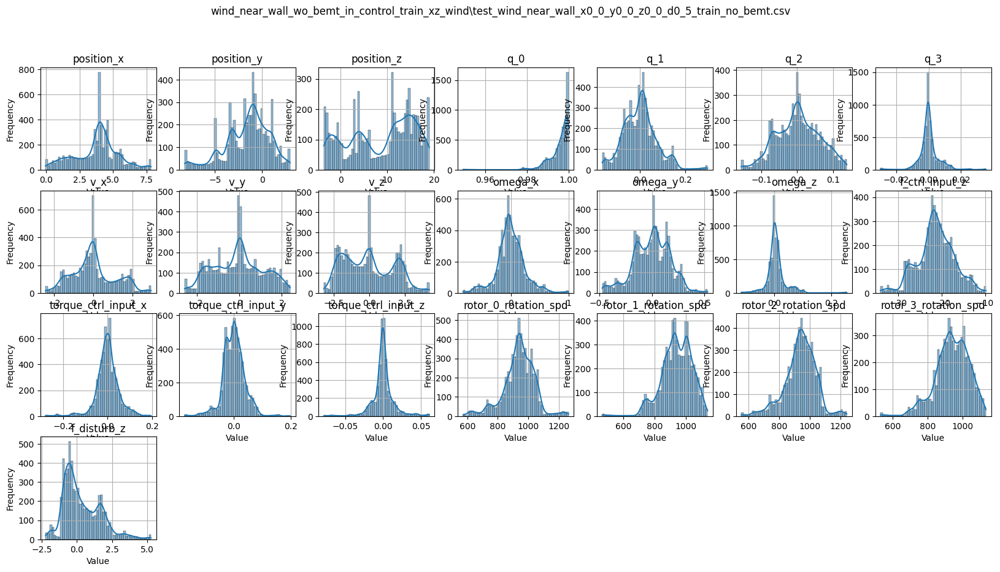

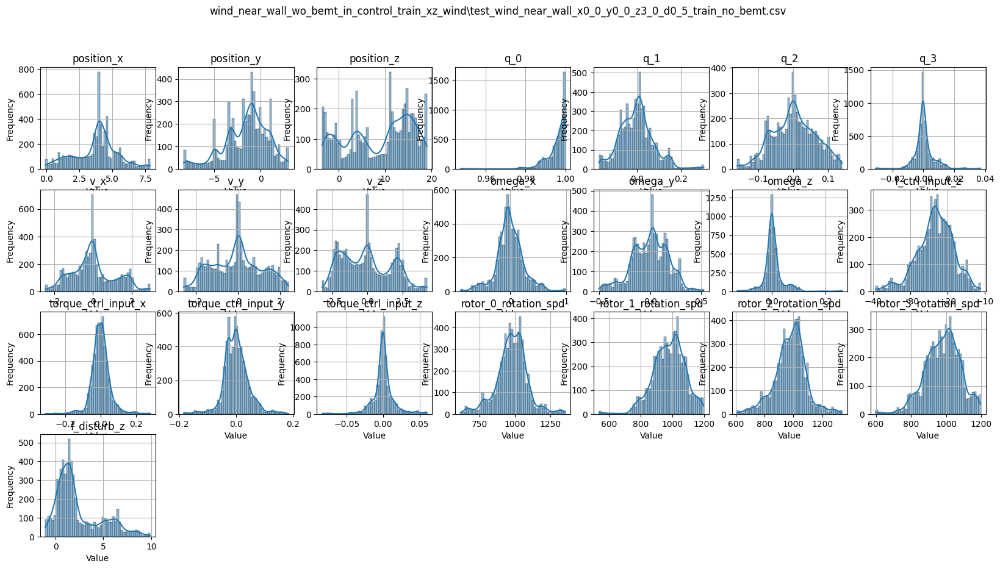

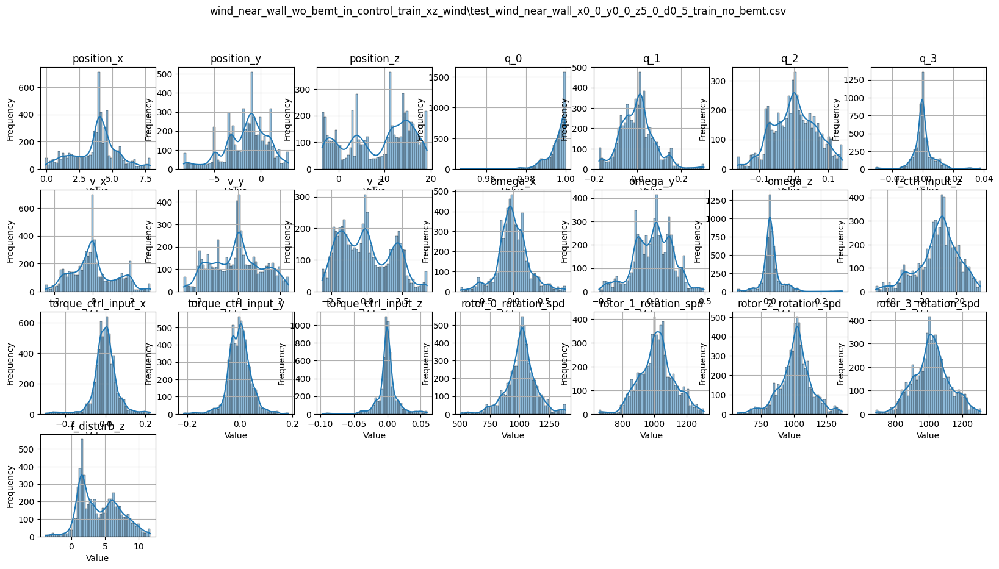

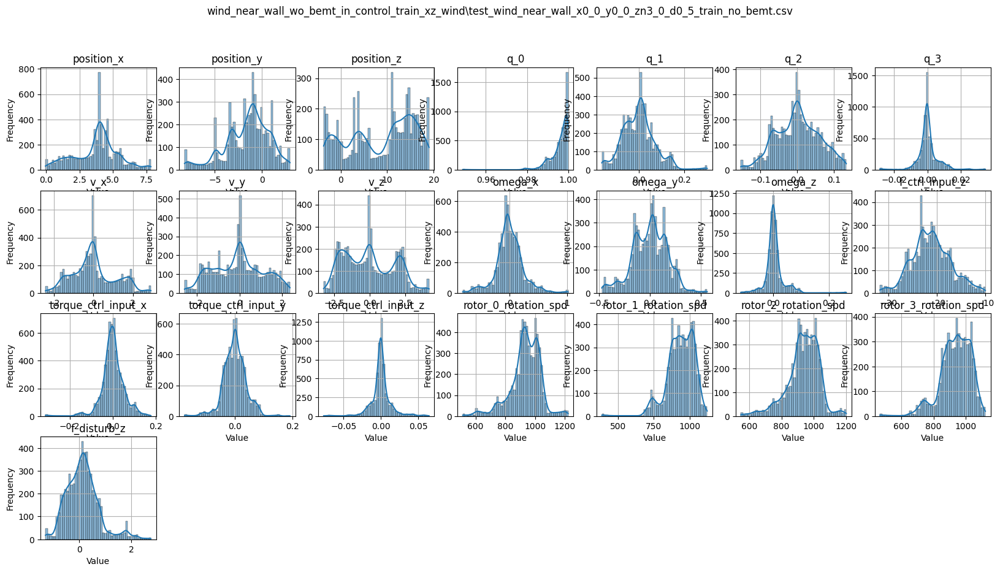

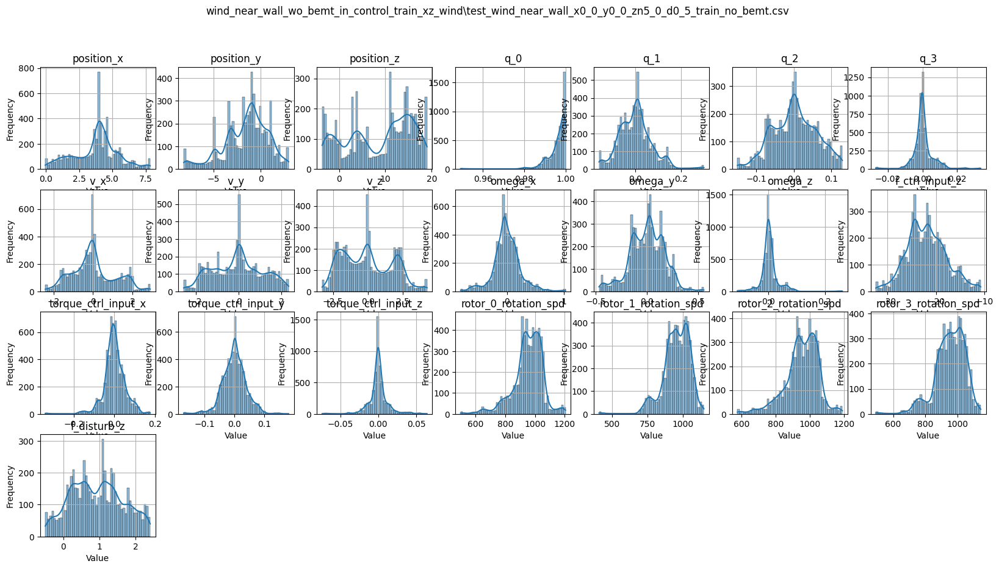

...

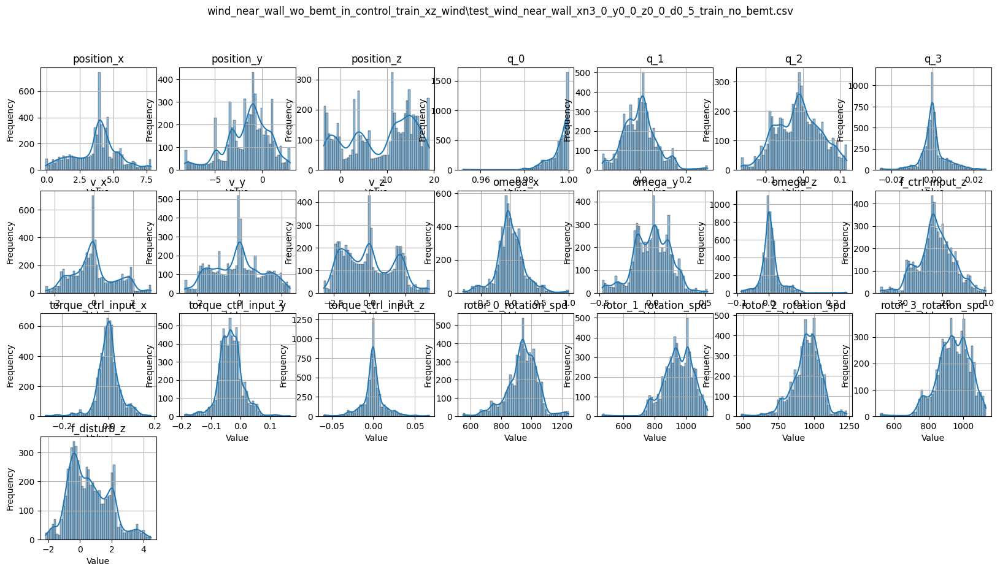

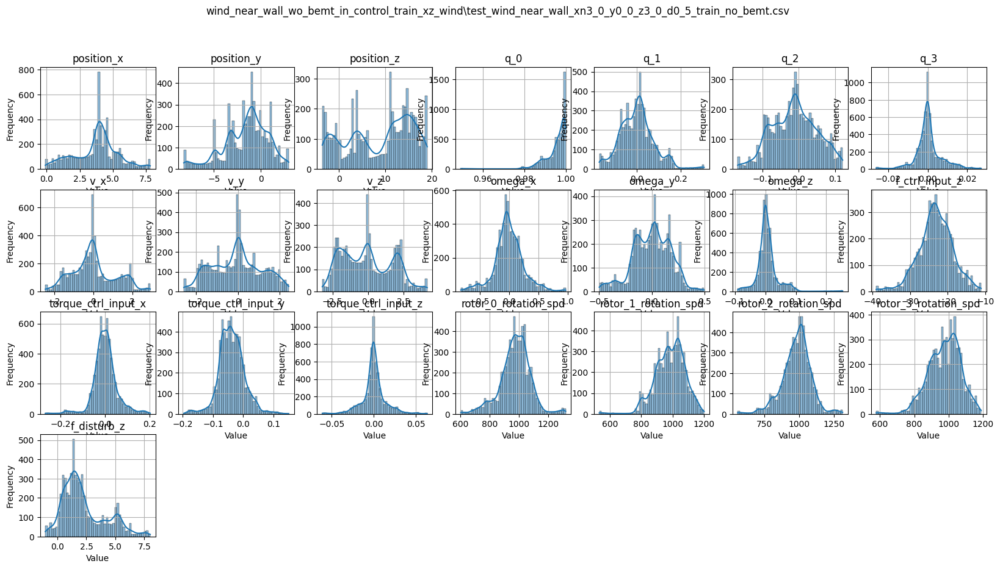

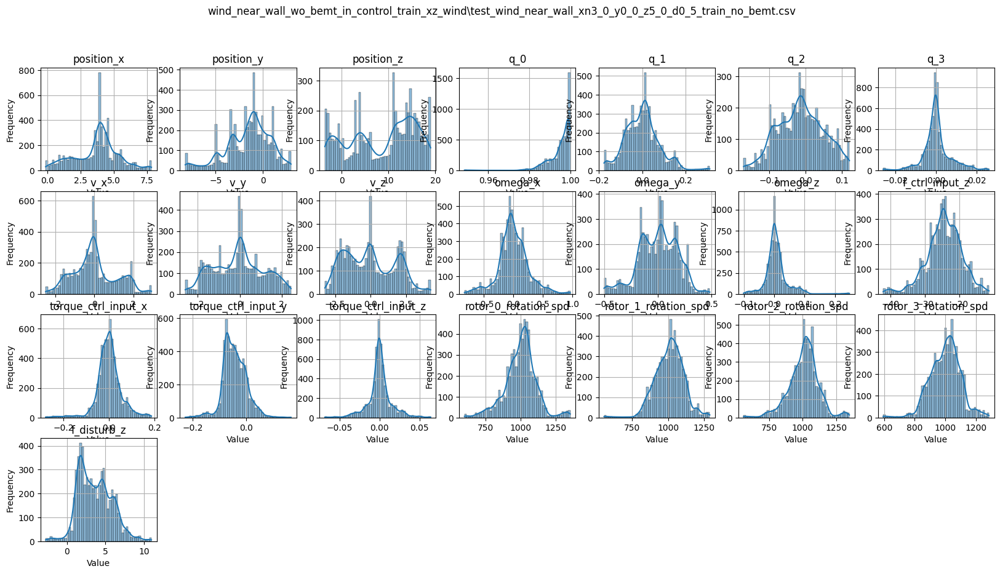

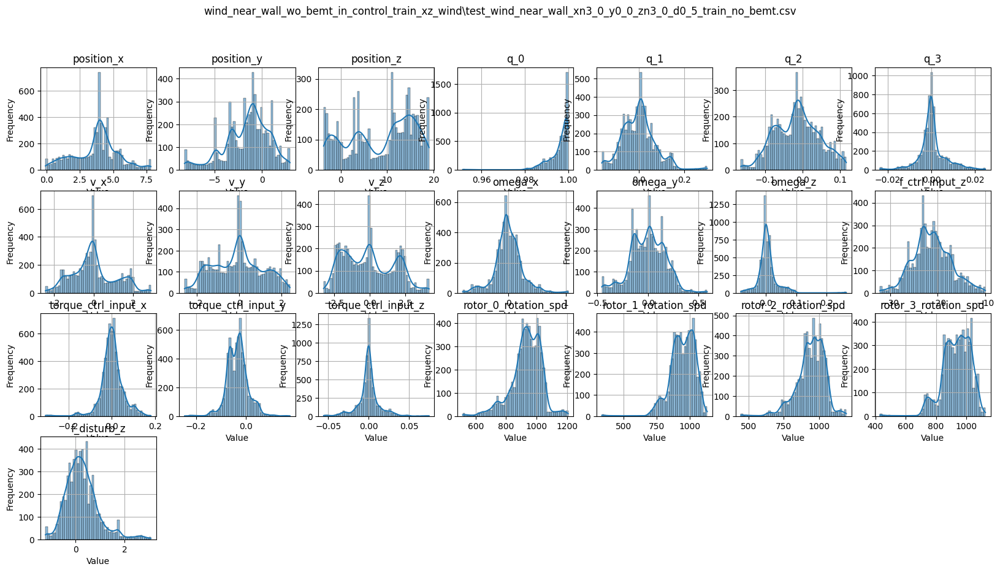

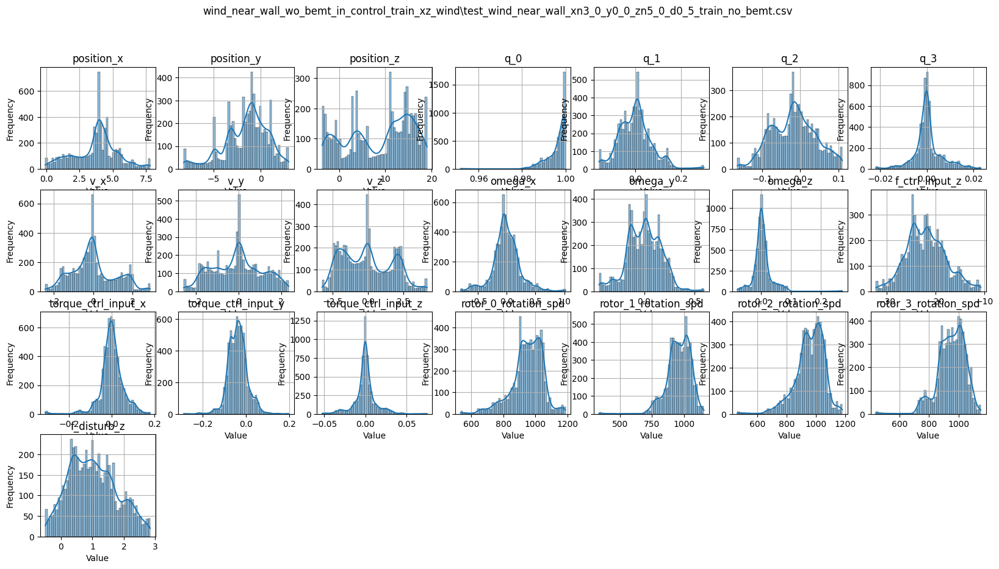

[1] loss_f: 22.35 loss_c: 2.75
[101] loss_f: 2.30 loss_c: 2.71


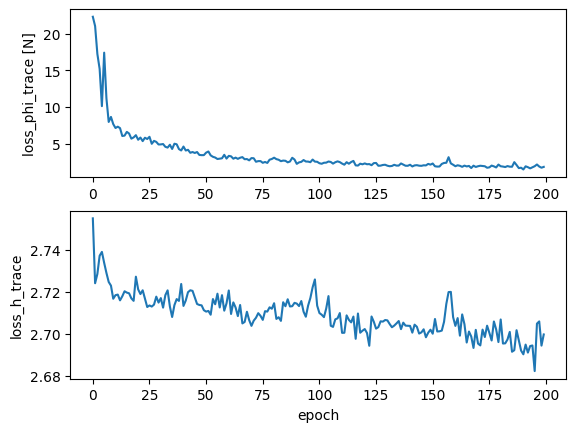

In [2]:
# use the data from previous section to train the model

manager = training_manager.TrainingManager()
manager.set_up(
    data_menu=data_list,
    # data_menu=data_list[:4],    # use small data list for quick testing
    input_label_map_file=path1,
    column_map_file=path2,
    can_skip_io_normalizaiton=False
)
plt.show() 
manager.train()
manager.trainer_instance.plot_loss()

plt.show()  

Inspect data in the data list.

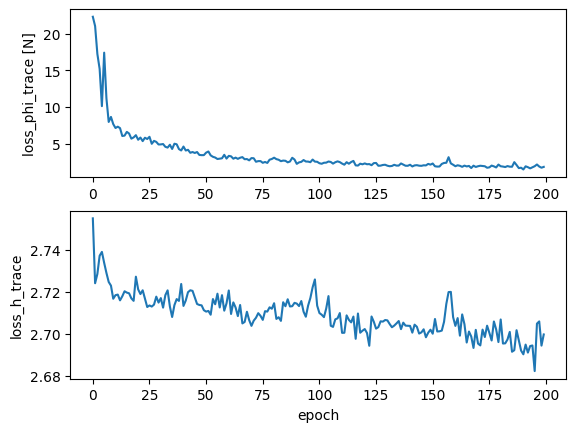

In [3]:
# trainer_instance.inspect_data(data_list[:2])
manager.trainer_instance.plot_loss()

Inspect t-sne of a_trace.

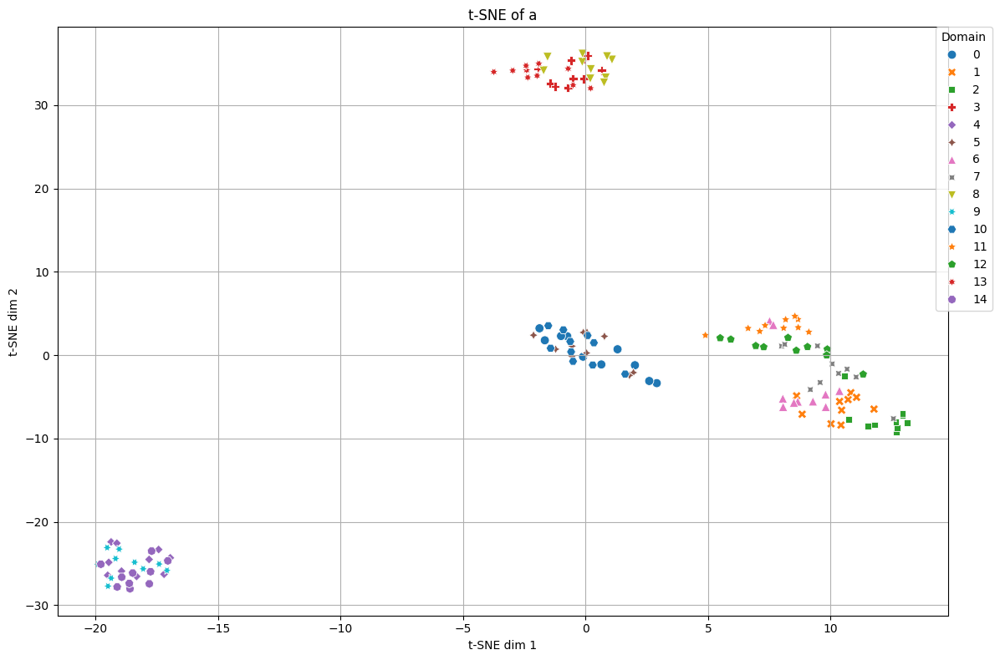

In [4]:
import performance_analyzer
can_print_3d = False
n = 100
performance_analyzer.plot_tsne_of_a(manager.trainer_instance.a_trace, list(range(n, n + 10)))
plt.show()  
if can_print_3d:
    %matplotlib tk
    performance_analyzer.plot_tsne_3d_of_a(manager.trainer_instance.a_trace, list(range(n, n + 10)))


After training, we can save the model in the following way.

In [5]:
model_name = subfolder
manager.save_model(model_name)

Model saved to model\wind_near_wall_wo_bemt_in_control_train_xz_wind.pth


Validate the model using the validation set.

wind_near_wall_validation_no_bemt\test_wind_near_wall_x0_0_y0_0_zn10_0_d0_5_validation_no_bemt.csv
wind_near_wall_validation_no_bemt\test_wind_near_wall_x0_0_y0_0_zn1_0_d0_5_validation_no_bemt.csv
wind_near_wall_validation_no_bemt\test_wind_near_wall_x0_0_y0_0_zn4_0_d0_5_validation_no_bemt.csv
wind_near_wall_validation_no_bemt\test_wind_near_wall_xn2_0_y0_0_zn10_0_d0_5_validation_no_bemt.csv
wind_near_wall_validation_no_bemt\test_wind_near_wall_xn2_0_y0_0_zn1_0_d0_5_validation_no_bemt.csv
wind_near_wall_validation_no_bemt\test_wind_near_wall_xn2_0_y0_0_zn4_0_d0_5_validation_no_bemt.csv
wind_near_wall_validation_no_bemt\test_wind_near_wall_xn5_0_y0_0_zn10_0_d0_5_validation_no_bemt.csv
wind_near_wall_validation_no_bemt\test_wind_near_wall_xn5_0_y0_0_zn1_0_d0_5_validation_no_bemt.csv
wind_near_wall_validation_no_bemt\test_wind_near_wall_xn5_0_y0_0_zn4_0_d0_5_validation_no_bemt.csv
phi net input output fields:
input ['position_x', 'position_y', 'position_z', 'q_0', 'q_1', 'q_2', 'q_3', 'v_

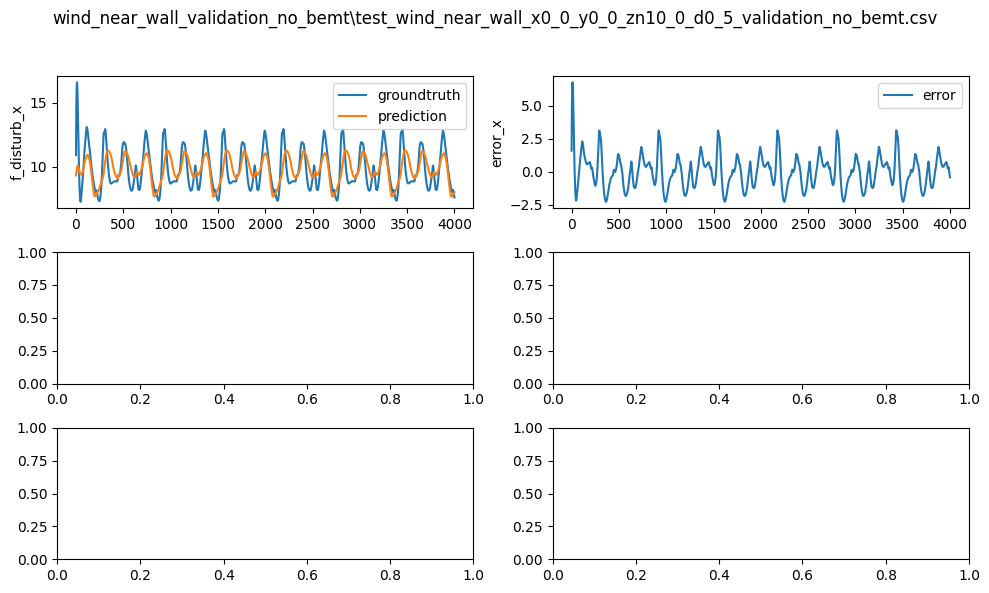

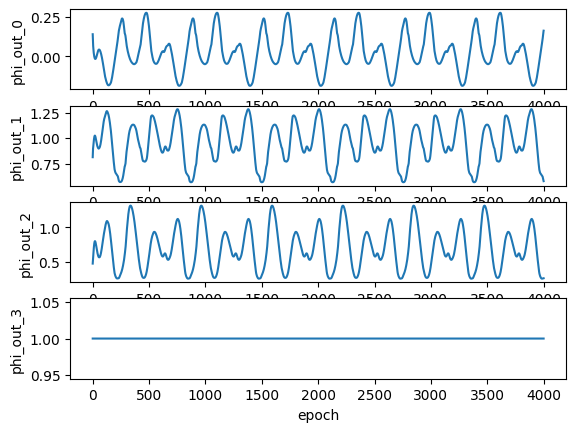

phi_out: tensor([[0.1401, 0.8097, 0.4651, 1.0000],
        [0.1382, 0.8124, 0.4673, 1.0000],
        [0.1368, 0.8147, 0.4693, 1.0000],
        ...,
        [0.2667, 0.4767, 0.1414, 1.0000],
        [0.2675, 0.4769, 0.1429, 1.0000],
        [0.2681, 0.4773, 0.1446, 1.0000]])
a = tensor([[ 18.0519],
        [  2.5634],
        [ 13.6393],
        [-11.6766]])
RMS: [1.96997516]
P90: [3.30426228]


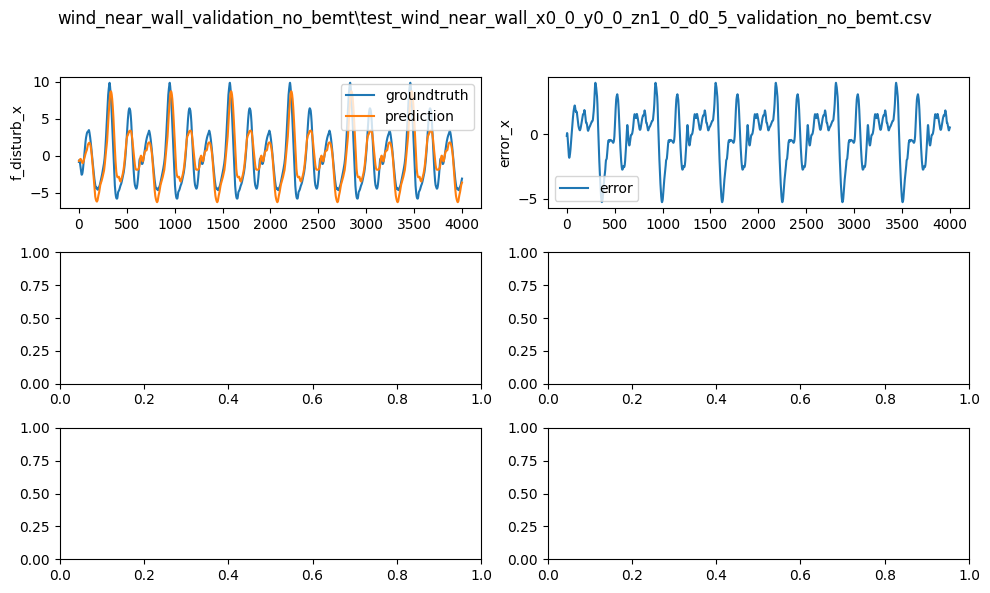

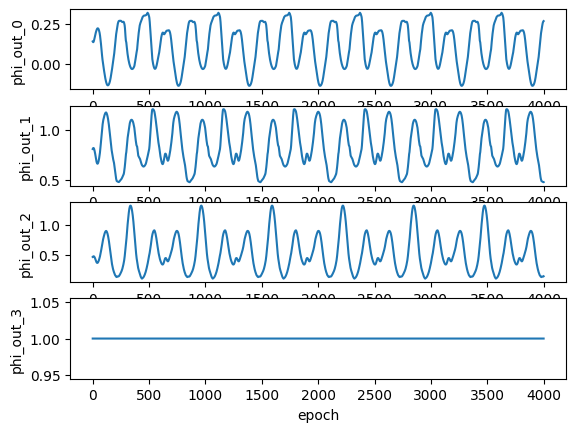

phi_out: tensor([[0.1400, 0.8100, 0.4656, 1.0000],
        [0.1358, 0.8159, 0.4704, 1.0000],
        [0.1321, 0.8214, 0.4750, 1.0000],
        ...,
        [0.2515, 0.4920, 0.1692, 1.0000],
        [0.2551, 0.4920, 0.1697, 1.0000],
        [0.2587, 0.4921, 0.1704, 1.0000]])
a = tensor([[10.2969],
        [ 1.6819],
        [ 7.5383],
        [-6.1084]])
RMS: [1.33446104]
P90: [2.07219722]


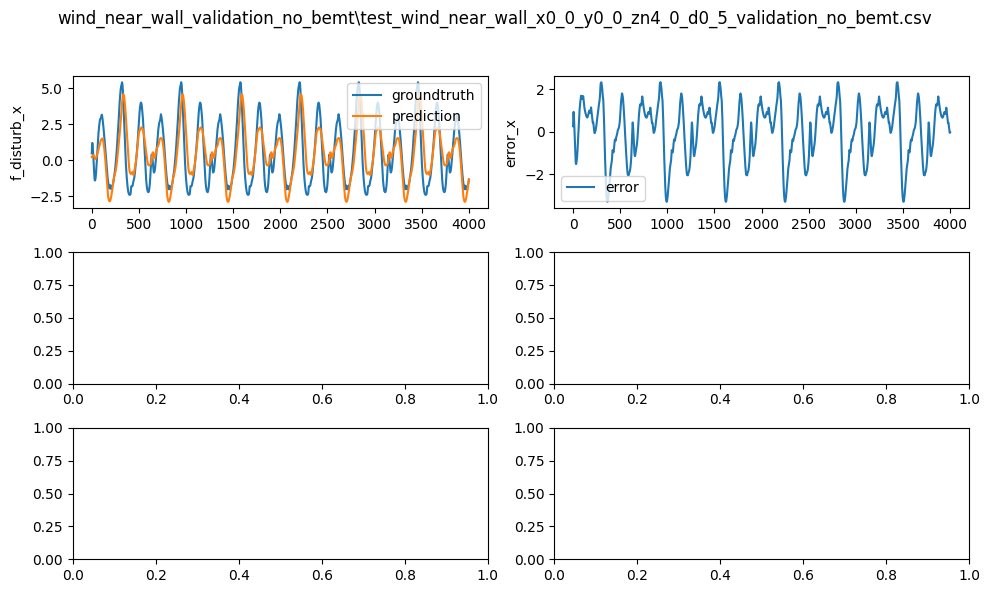

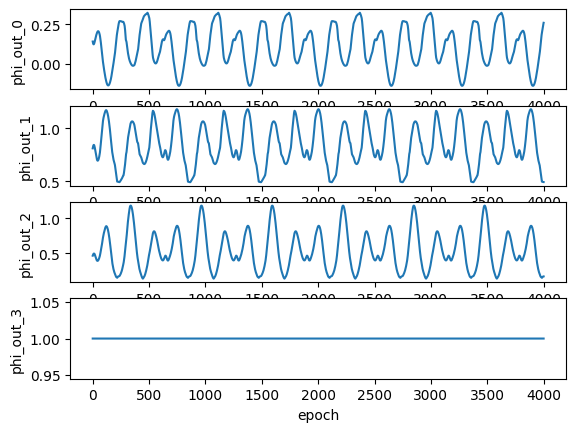

phi_out: tensor([[0.1397, 0.8130, 0.4700, 1.0000],
        [0.1180, 0.8445, 0.4962, 1.0000],
        [0.0961, 0.8753, 0.5223, 1.0000],
        ...,
        [0.1545, 0.5892, 0.2554, 1.0000],
        [0.1598, 0.5848, 0.2563, 1.0000],
        [0.1642, 0.5812, 0.2578, 1.0000]])
a = tensor([[6.5616],
        [6.8667],
        [1.0862],
        [2.3004]])
RMS: [1.23456121]
P90: [2.04791817]


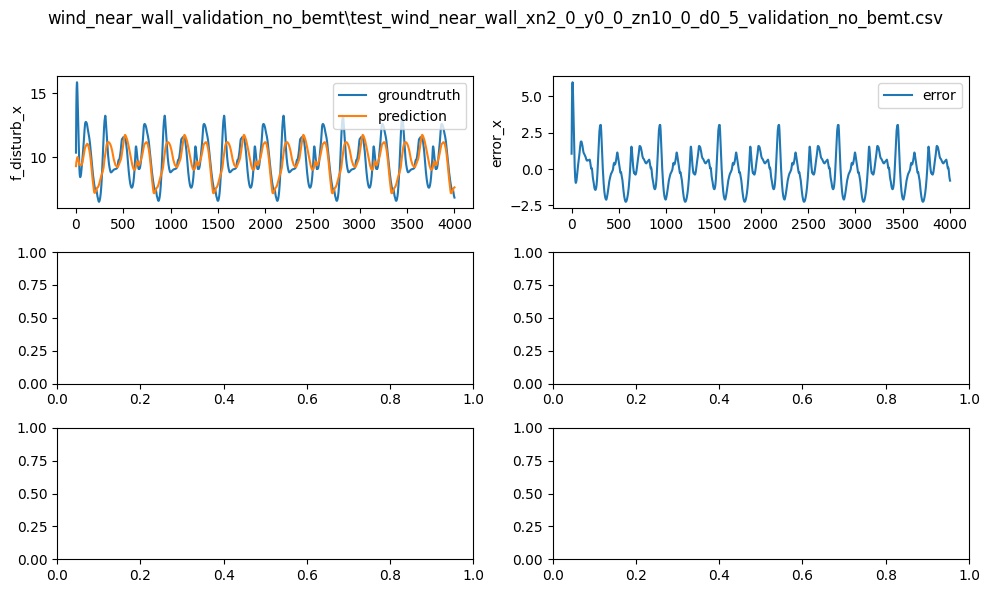

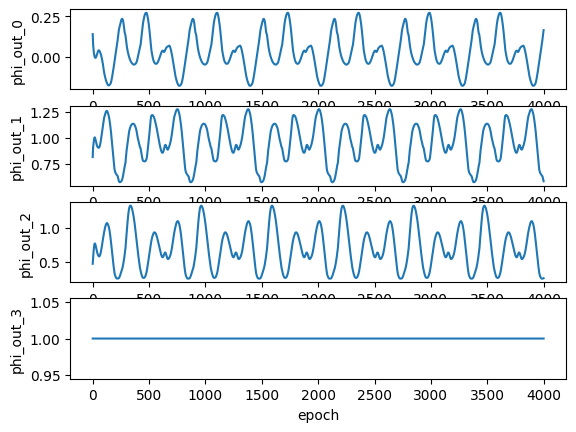

phi_out: tensor([[0.1400, 0.8098, 0.4653, 1.0000],
        [0.1382, 0.8136, 0.4687, 1.0000],
        [0.1369, 0.8168, 0.4717, 1.0000],
        ...,
        [0.2669, 0.4781, 0.1414, 1.0000],
        [0.2676, 0.4784, 0.1430, 1.0000],
        [0.2683, 0.4789, 0.1448, 1.0000]])
a = tensor([[ 17.4629],
        [  4.4601],
        [ 12.4292],
        [-12.4174]])
RMS: [2.04674389]
P90: [3.39336437]


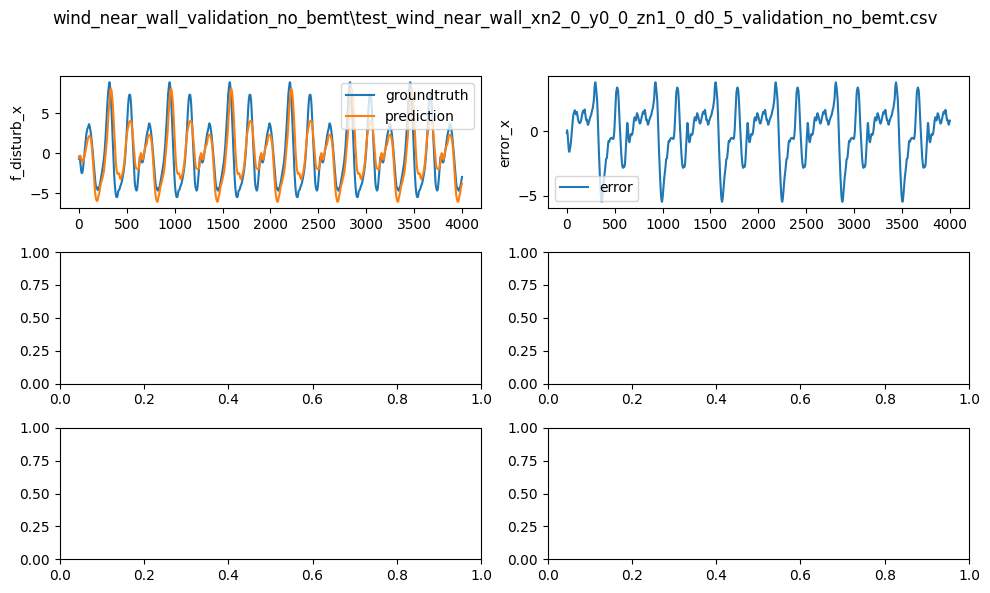

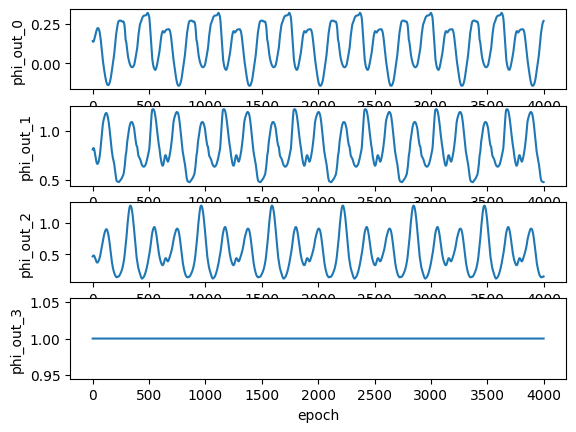

phi_out: tensor([[0.1400, 0.8102, 0.4658, 1.0000],
        [0.1364, 0.8168, 0.4716, 1.0000],
        [0.1333, 0.8228, 0.4770, 1.0000],
        ...,
        [0.2553, 0.4925, 0.1662, 1.0000],
        [0.2588, 0.4926, 0.1669, 1.0000],
        [0.2615, 0.4919, 0.1671, 1.0000]])
a = tensor([[11.8056],
        [ 3.9228],
        [ 6.9515],
        [-7.8843]])
RMS: [1.29260482]
P90: [2.14731022]


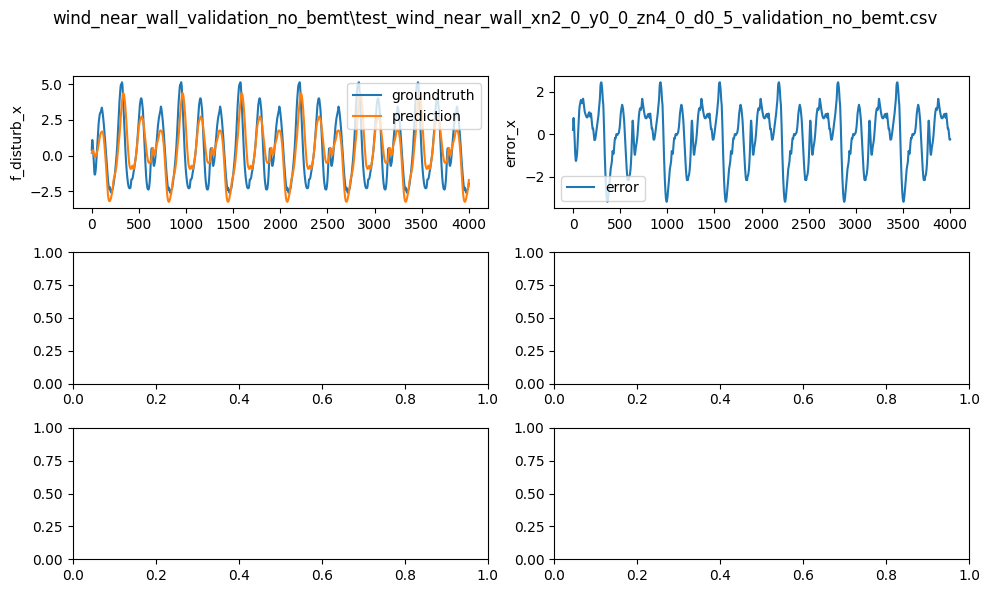

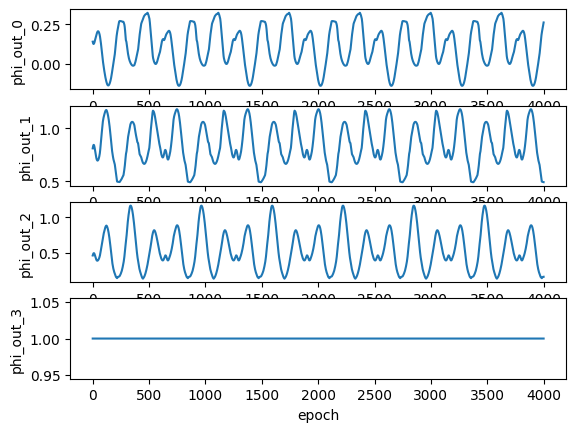

phi_out: tensor([[0.1397, 0.8132, 0.4703, 1.0000],
        [0.1193, 0.8460, 0.4985, 1.0000],
        [0.0994, 0.8769, 0.5255, 1.0000],
        ...,
        [0.1696, 0.5727, 0.2385, 1.0000],
        [0.1738, 0.5685, 0.2397, 1.0000],
        [0.1775, 0.5667, 0.2423, 1.0000]])
a = tensor([[ 8.6962],
        [10.5594],
        [ 0.5065],
        [-0.7798]])
RMS: [1.38584167]
P90: [2.1971168]


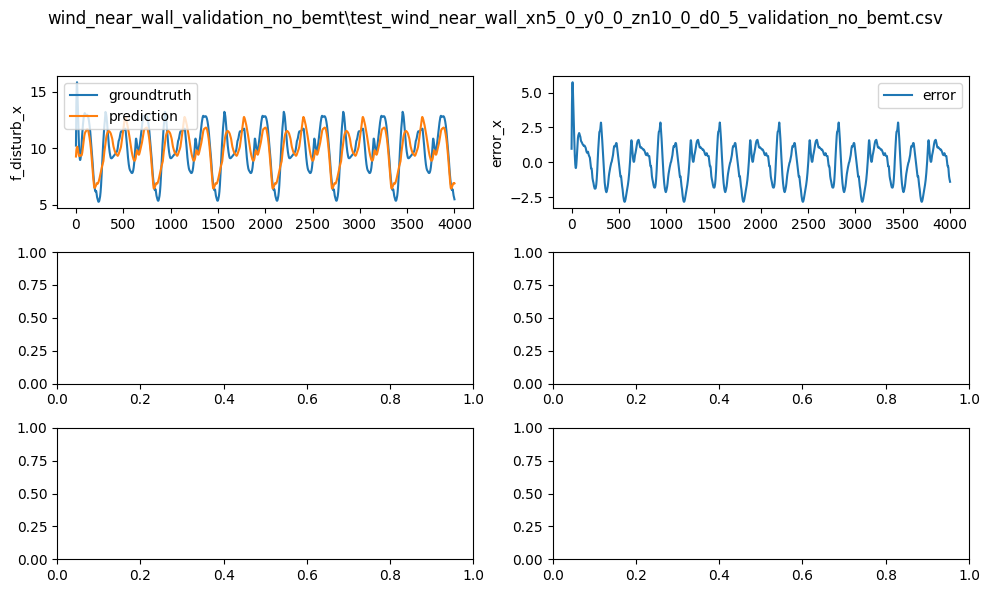

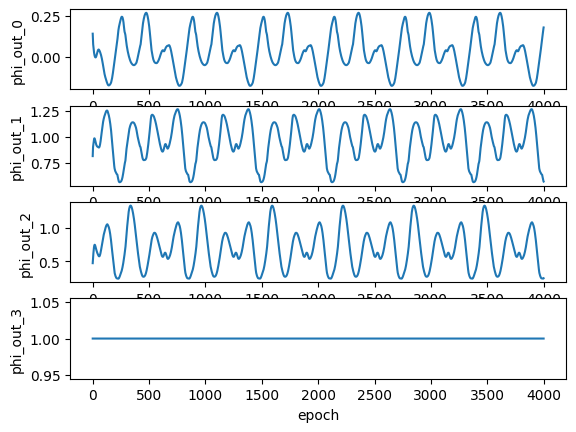

phi_out: tensor([[0.1400, 0.8102, 0.4659, 1.0000],
        [0.1371, 0.8171, 0.4722, 1.0000],
        [0.1347, 0.8233, 0.4781, 1.0000],
        ...,
        [0.2510, 0.4970, 0.1734, 1.0000],
        [0.2540, 0.4974, 0.1749, 1.0000],
        [0.2569, 0.4979, 0.1766, 1.0000]])
a = tensor([[12.0838],
        [ 2.8778],
        [11.1448],
        [-9.0985]])
RMS: [2.33094562]
P90: [4.0821386]


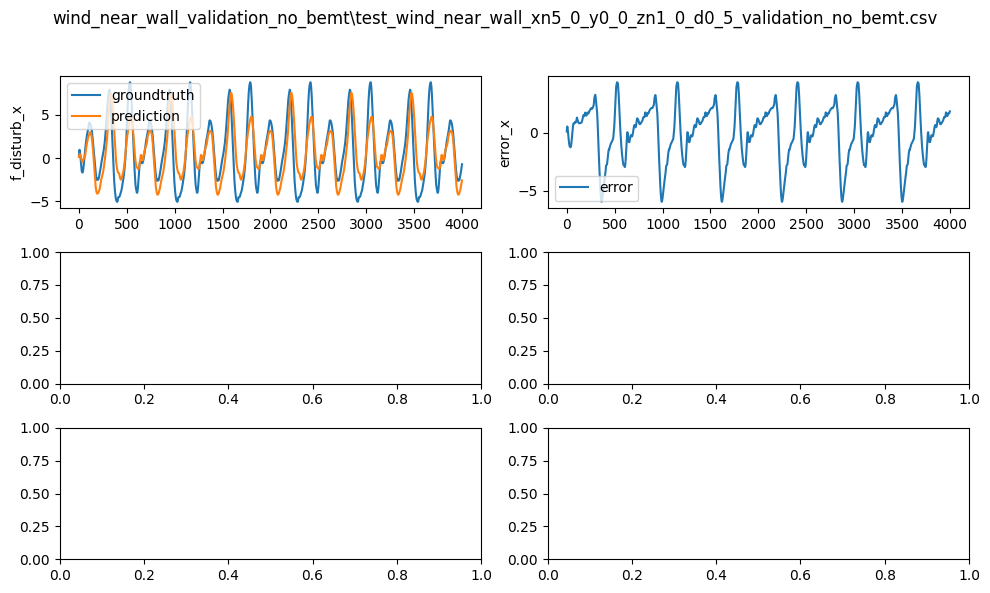

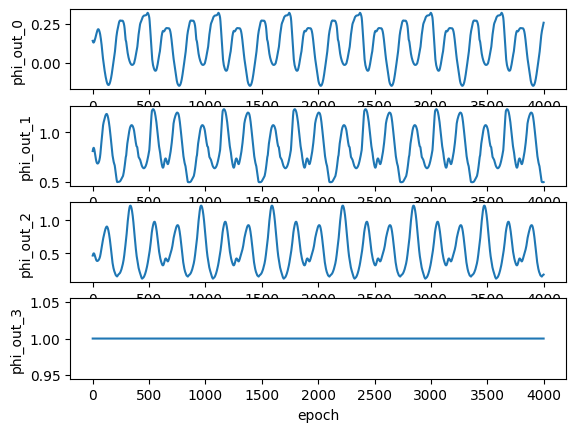

phi_out: tensor([[0.1400, 0.8105, 0.4661, 1.0000],
        [0.1370, 0.8187, 0.4739, 1.0000],
        [0.1345, 0.8261, 0.4811, 1.0000],
        ...,
        [0.2549, 0.4969, 0.1702, 1.0000],
        [0.2583, 0.4972, 0.1713, 1.0000],
        [0.2612, 0.4972, 0.1723, 1.0000]])
a = tensor([[13.3416],
        [ 6.3961],
        [ 6.2391],
        [-9.5494]])
RMS: [1.31258006]
P90: [2.29053993]


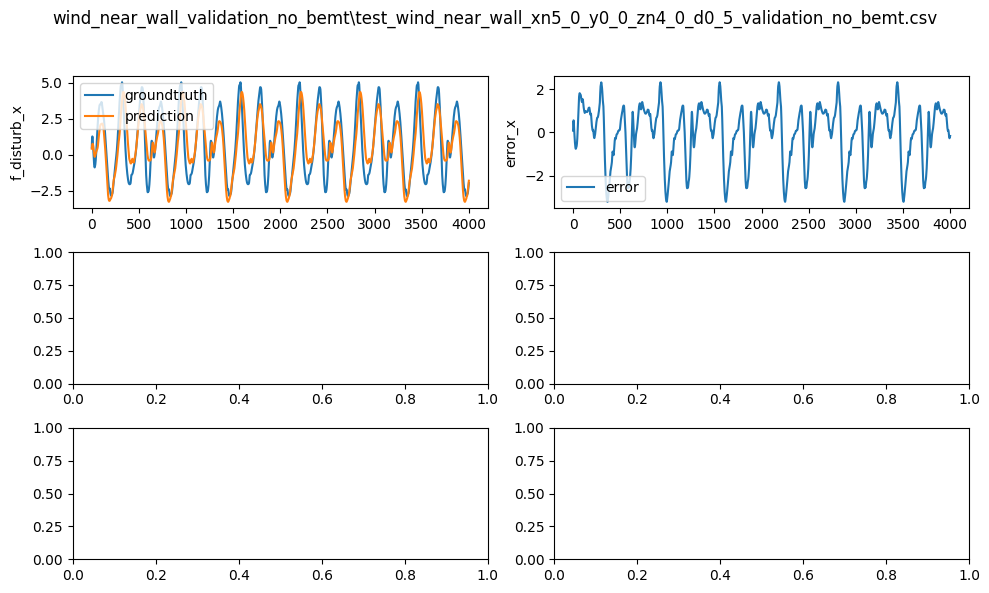

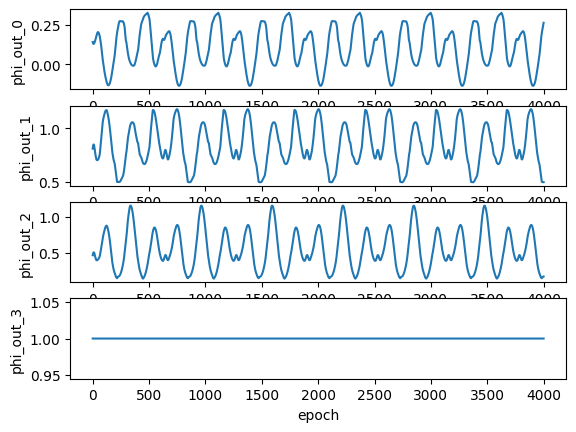

In [ ]:
%matplotlib inline
current_dir = os.getcwd()
subfolder = "wind_near_wall_validation_bemt"
# subfolder = "wind_near_wall_validation_no_bemt"
# subfolder = "wind_near_wall_bemt_in_control_train_xz_wind"
# subfolder = "wind_near_wall_wo_bemt_in_control_train_xz_wind"
# subfolder = "nf_validation_back2back"
folder_path = os.path.join(os.path.dirname(current_dir), "data", "training", subfolder)
file_names = [f for f in os.listdir(folder_path) if os.path.isfile(os.path.join(folder_path, f))]

# Filter out files that do not end with .csv
file_names = [f for f in file_names if f.endswith('.csv')]
# add subfolder to the file names
data_list = [os.path.join(subfolder, f) for f in file_names]
for data in data_list:
    print(data)

# debug
# data_list = data_list[:1]  # use small data list for quick testing

phi, h = training_manager.load_model(model_name)
# make a new trainer to replicate the above setup, just to allow verify_model to work
manager.validate(phi, h, data_list)
plt.show()  
